In [1]:
from numpy import sqrt
import numpy as np
import matplotlib.pyplot as plt
from numpy import pi, sin, cos


plt.rc("font", family="serif", size=16)
plt.rc("mathtext", fontset="cm")
plt.rc("lines", lw=2)
plt.rc("font", family="serif", size=16)

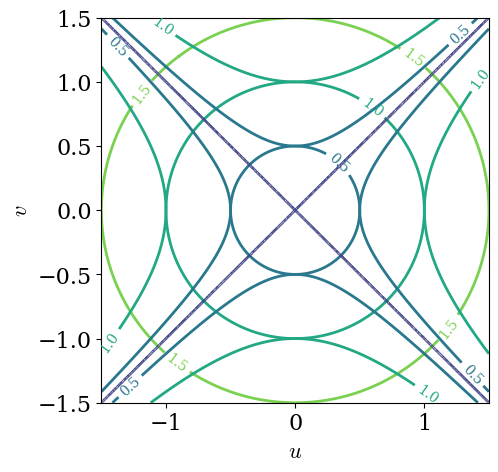

In [231]:
L = 1.5
N = 1001
u = np.linspace(-L, L, N)
v = np.linspace(-L, L, N)
u, v = np.meshgrid(u, v)

x = lambda u, v : sqrt(u**2 + v**2)
y = lambda u, v : sqrt(np.abs(u**2 - v**2))

fig, ax = plt.subplots(figsize=(5, 5))

CS1 = ax.contour(u, v, x(u, v), levels=np.linspace(0.0001, L, 4), vmin = -.5, vmax=2)
CS2 = ax.contour(u, v, y(u, v), levels=np.linspace(0.0001, L, 4), vmin = -.5, vmax=2)
ax.clabel(CS1, inline=True, fontsize=10)
ax.clabel(CS2, inline=True, fontsize=10)


ax.set_xlabel("$u$")
ax.set_ylabel("$v$")
fig.savefig('fig/assym/coord.pdf',bbox_inches="tight")
plt.show()

In [2]:
f = lambda x, y, a :  (x**2 - 1)**2 + a**2 - y**4
N = 4_001
x, y = np.linspace(-L, L, N), np.linspace(-L, L, N) 
x, y = np.meshgrid(x, y)

aa = [0, 0.4]

for a in aa:
    fig, ax = plt.subplots()
    plt.contour(x, y, f(x, y, a))
    plt.contour(x, y, f(x, y, a), levels=[0], colors="black")

    ax.set_xlabel("$x$")
    ax.set_ylabel("$y$") 

NameError: name 'L' is not defined

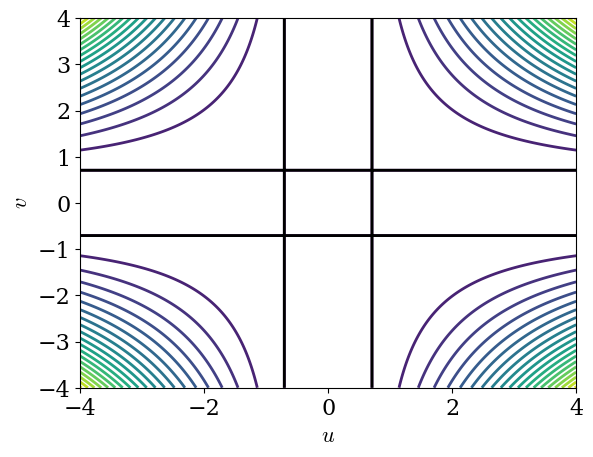

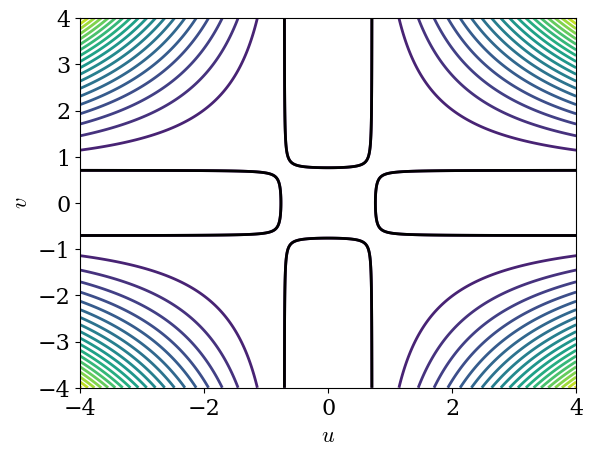

In [3]:
N = 4_001
L = 4
u, v = np.linspace(-L, L, N), np.linspace(-L, L, N) 
u, v = np.meshgrid(u, v)

aa = [0, 0.4]

x = lambda u, v : sqrt(u**2 + v**2)
y = lambda u, v : sqrt(np.abs(u**2 - v**2))

for a in aa:
    fig, ax = plt.subplots()
    plt.contour(u, v, f(x(u, v), y(u, v), a ), levels=20)
    plt.contour(u, v, f(x(u, v), y(u, v), a), levels=[0], colors="black")

    ax.set_xlabel("$u$")
    ax.set_ylabel("$v$") 
    plt.show()

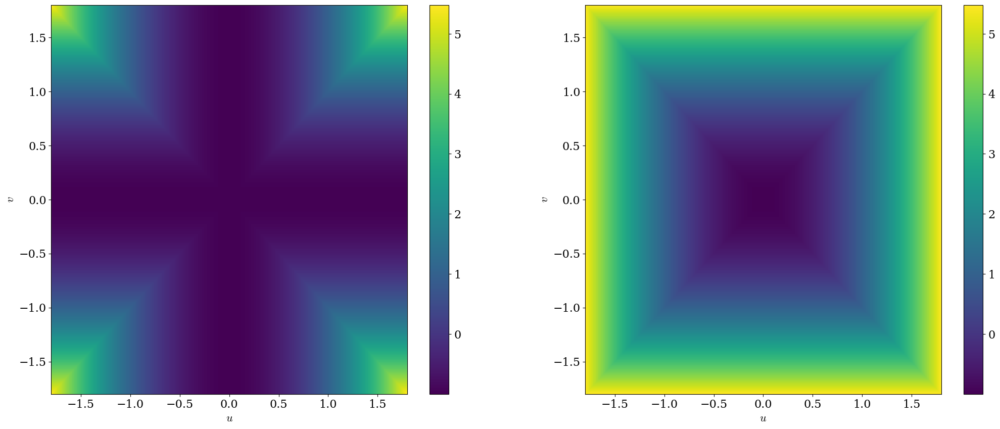

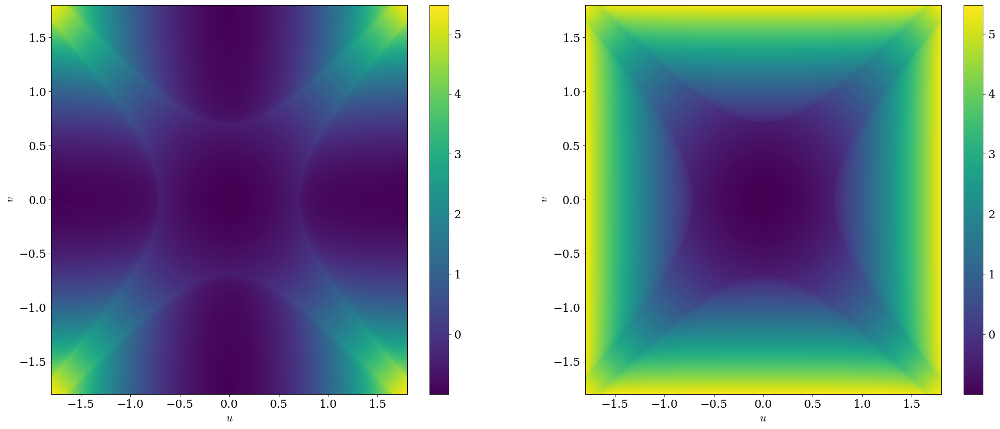

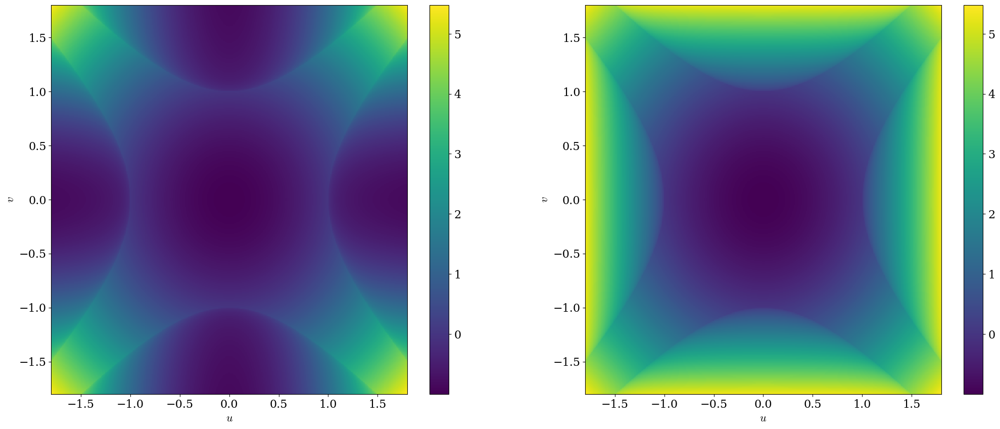

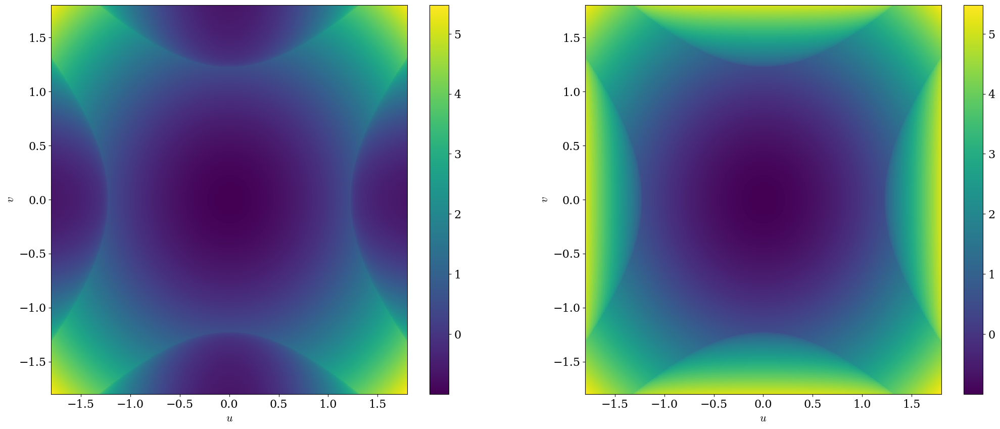

In [4]:
N = 500
L = 1.8
u, v = np.linspace(-L, L, N), np.linspace(-L, L, N) 
u, v = np.meshgrid(u, v)

f1 = lambda x, y, a :  ((x**2 - 1) - sqrt(y**4 - a**2 + 0j)).real
f2 = lambda x, y, a :  ((x**2 - 1) + sqrt(y**4 - a**2 + 0j)).real
f = [f1, f2]

aa = [0, 0.5, 1, 1.5]

x = lambda u, v : sqrt(u**2 + v**2)
y = lambda u, v : sqrt(np.abs(u**2 - v**2))

g = lambda v, a: sqrt(v**2 + a)
v0 = np.linspace(0, L, 500) 

for a in aa:
    fig, axs = plt.subplots(1,2,figsize=(25, 10))
    for i, ax in enumerate(axs):
        im = ax.pcolormesh(u, v, f[i](x(u, v), y(u, v), a ))
        fig.colorbar(im, ax=ax)

        ax.set_xlabel("$u$")
        ax.set_ylabel("$v$") 
        ax.set_xlim(-L, L)
        ax.set_ylim(-L, L)
    plt.show()

/tmp/ipykernel_310037/3696492156.py:22: RuntimeWarning: invalid value encountered in sqrt
  CEP2 = np.sqrt((1 - a) / 2)


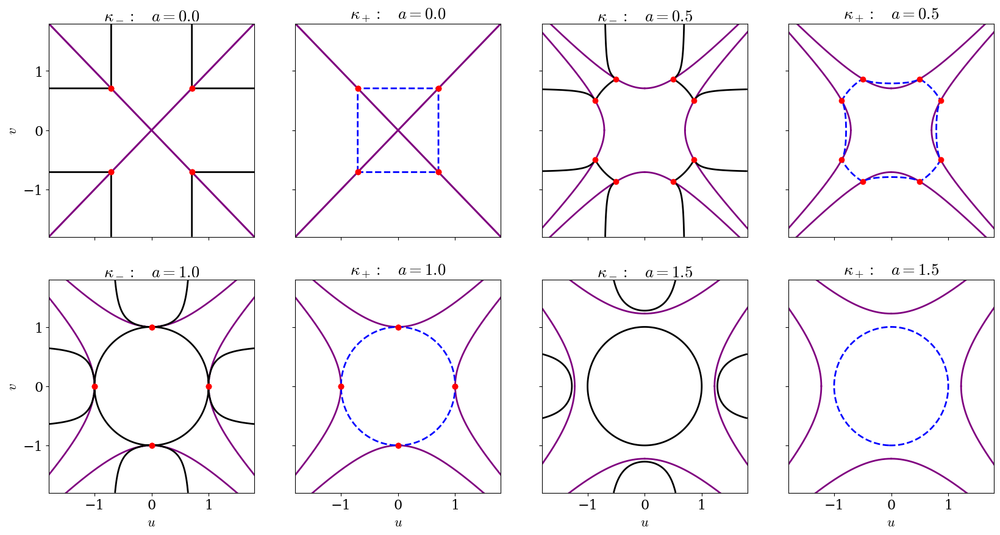

In [5]:
aa = [0, 0.5, 1, 1.5]

fig, axs = plt.subplots(len(aa)//2,2*2,figsize=(20, 10), sharex=True, sharey=True) 
sign = ["-", "+"]
for j, a in enumerate(aa):
    for i in range(2):
        n = j * 2 + i
        ax = axs.flatten()[n]
        # if a>0:
        u0 = g(v0, a)
        list1 = [u0, u0, -u0, -u0, v0, v0, -v0, -v0]
        list2 = [v0, -v0, v0, -v0, u0, -u0, u0, -u0]
        for l1, l2 in zip(list1, list2):
            ax.plot(l1, l2, "purple")

        color = 'blue' if i == 1 else 'black'
        ls = '--' if i==1 else "-"

        ax.contour(u, v, f[i](x(u, v), y(u, v), a), levels=[0], colors=color, linestyles=ls)

        CEP1 = np.sqrt((1 + a) / 2)
        CEP2 = np.sqrt((1 - a) / 2)
        c1 = [CEP1, CEP1, -CEP1, -CEP1, CEP2, CEP2, -CEP2, -CEP2]
        c2 = [CEP2, -CEP2, CEP2, -CEP2, CEP1, -CEP1, CEP1, -CEP1]
        if a <= 1:
            for a1, a2 in zip(c1, c2):
                ax.plot(a1, a2, 'ro')

        if n>=4:
            ax.set_xlabel("$u$")
        if n ==0 or n == 4:
            ax.set_ylabel("$v$")
        ax.set_xlim(-L, L)
        ax.set_ylim(-L, L)
        ax.set_title("$\\kappa_"+ sign[i] + f": \\quad  a = %.1f$"%(a))
# plt.tight_layout()

fig.savefig('fig/assym/cirt_and_ex.pdf',bbox_inches="tight")

plt.show()

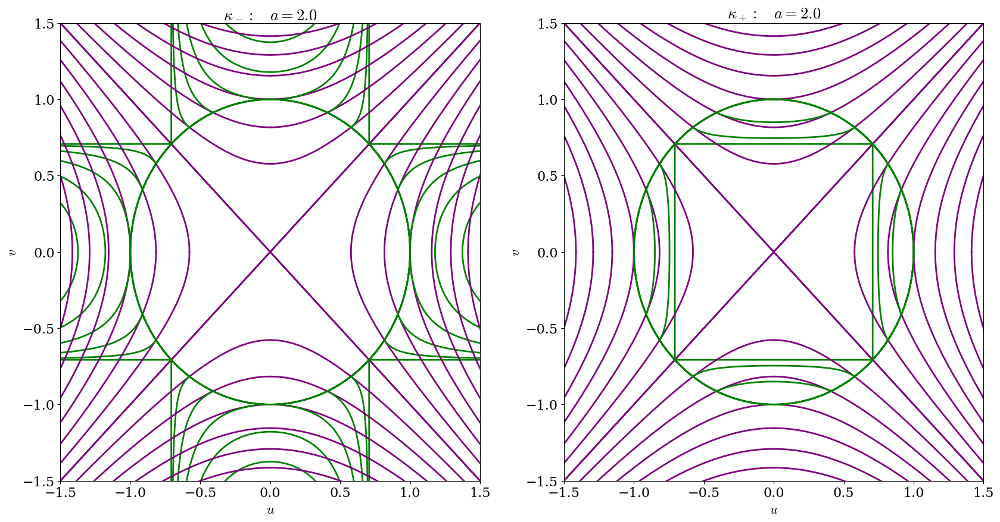

In [ ]:
fig, axs = plt.subplots(1,2,figsize=(20, 10)) 
sign = ["-", "+"]

aa = np.linspace(0, 2, 7)
L = 1.5
for j, a in enumerate(aa):
    for i in range(2):
        ax = axs[i]
        u0 = g(v0, a)
        list1 = [u0, u0, -u0, -u0, v0, v0, -v0, -v0]
        list2 = [v0, -v0, v0, -v0, u0, -u0, u0, -u0]
        for l1, l2 in zip(list1, list2):
            ax.plot(l1, l2, "purple")

        ax.contour(u, v, f[i](x(u, v), y(u, v), a), levels=[0], colors="green")

        ax.set_xlabel("$u$")
        ax.set_ylabel("$v$")
        ax.set_xlim(-L, L)
        ax.set_ylim(-L, L)
        ax.set_title("$\\kappa_"+ sign[i] + f": \\quad  a = %.1f$"%(a))
plt.show()

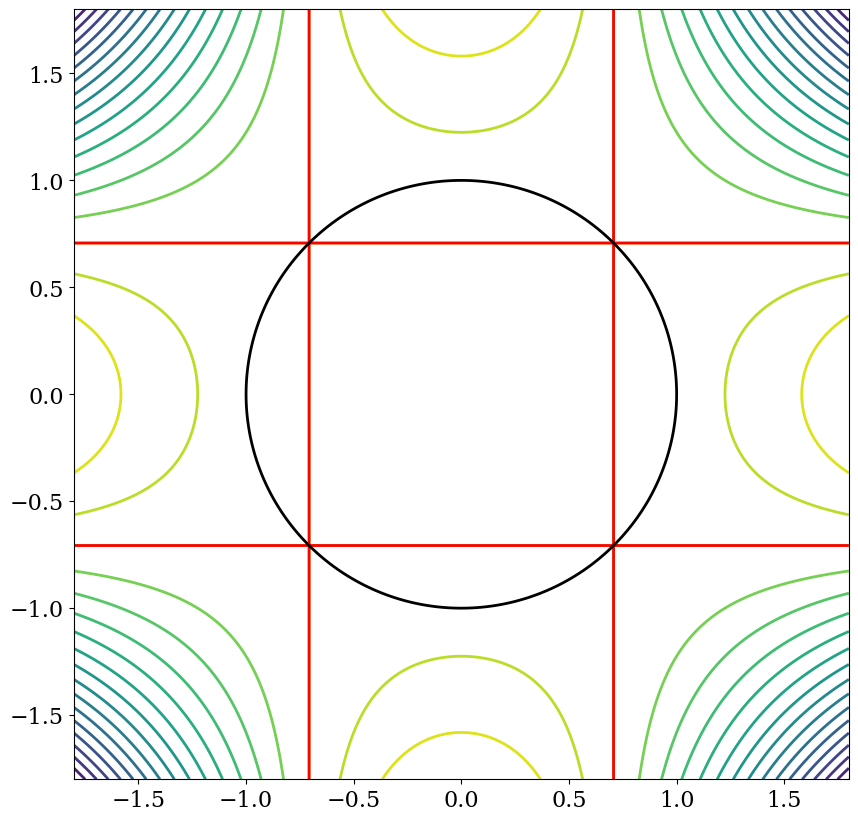

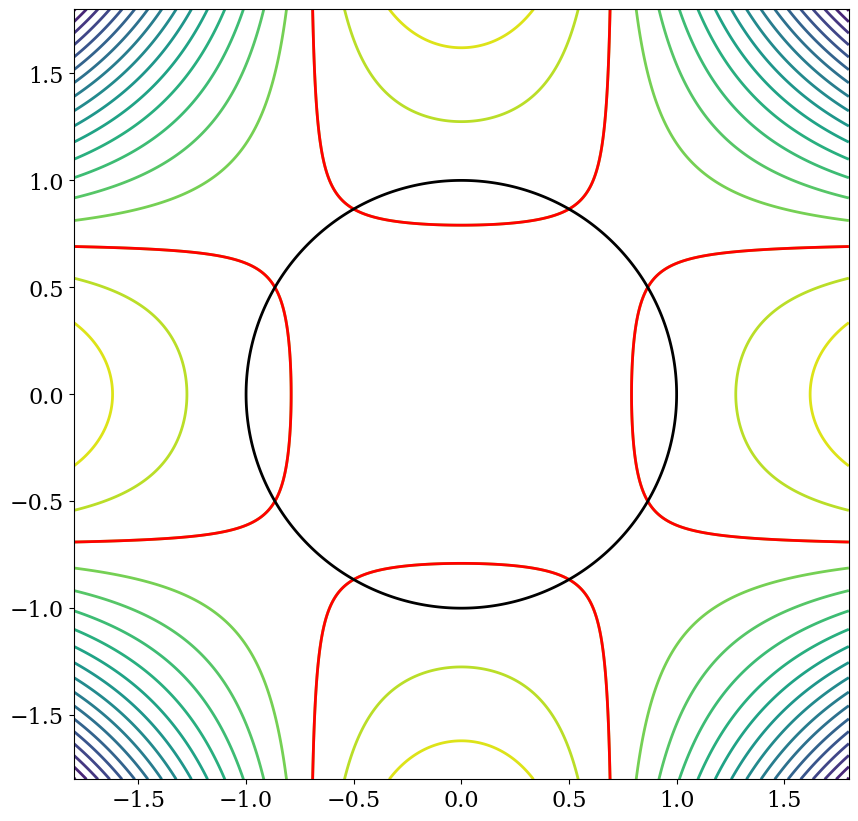

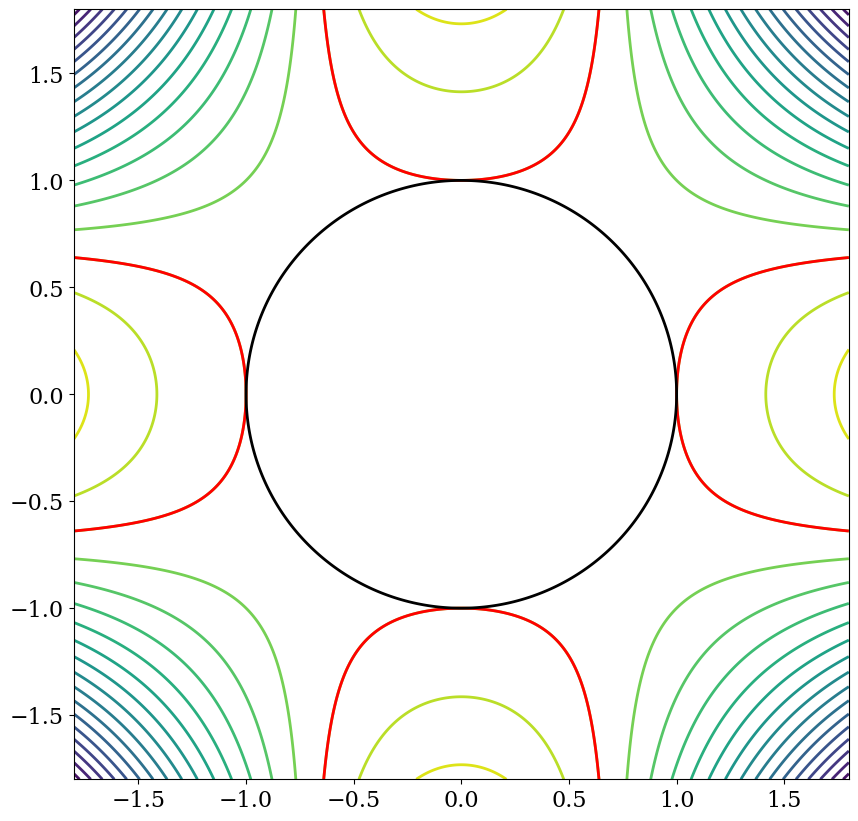

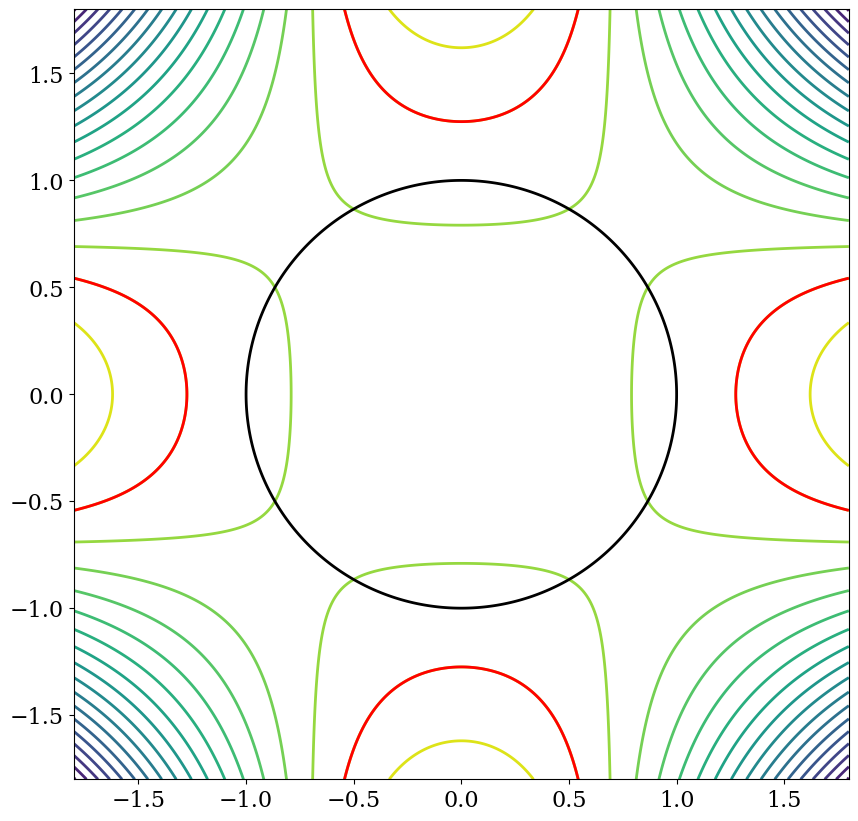

In [6]:
eq = lambda u, v, a : u**2 + v**2 - 2*u**2*v**2 - (1 + a**2) / 2

u0 = np.linspace(-L, L, 1001)
v0 = np.linspace(-L, L, 1001)
u, v = np.meshgrid(u0, v0)

for a in aa:
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.contour(u, v, eq(u, v, a), levels=20)
    ax.contour(u, v, eq(u, v, a), levels=[0,], colors="red")

    ax.contour(u, v, u**2 + v**2 - 1, levels=[0,], colors="black")
    
    plt.show()

NameError: name 'cm' is not defined

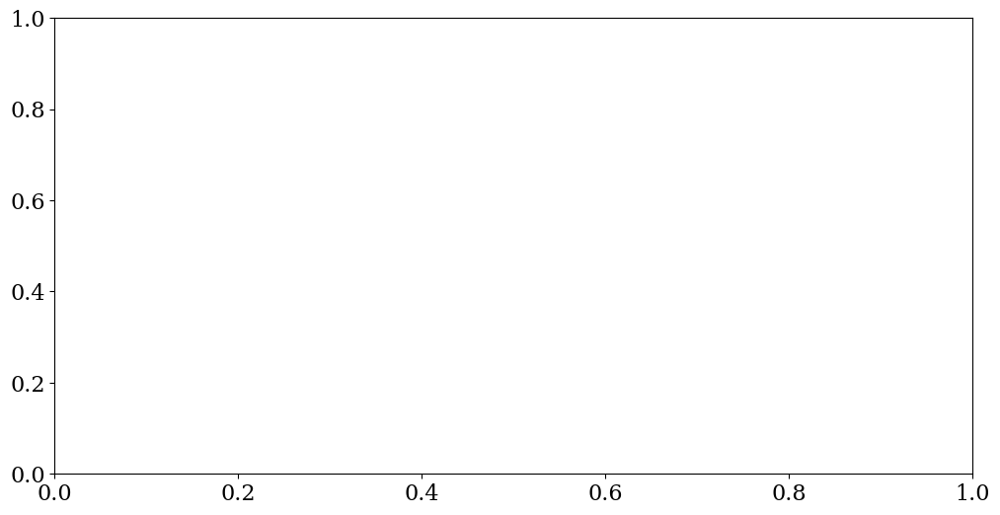

In [7]:
u_crit = lambda v, a : np.sqrt((1/ 2 * (2 * v**2 - (1 + a**2)) / (2 * v**2 - 1)))

v = np.linspace(-L, L, 10001)
fig, ax = plt.subplots(figsize=(12, 6))
for i, a in enumerate(aa[:-1]):
    ax.plot(v, u_crit(v, a), color=cm.viridis(i/(len(aa)-1)), label="a = %.1f"%a)
    if a == 0:
        ax.plot([M, M], [0, L], color=cm.viridis(i/(len(aa)-1)))
        ax.plot([-M, -M], [0, L], color=cm.viridis(i/(len(aa)-1)))
    # ax.plot(u_crit(v, a), v)
    # ax.plot(v, sqrt(1 - v**2))
    # ax.plot(v, sqrt(a + v**2)) 
    # ax.plot([np.sqrt((1 + a**2)/2), np.sqrt((1 + a**2)/2)], [0, 1])

ax.set_ylim(0, L)
ax.set_xlim(-L, L)
ax.legend()

ax.set_xlabel("$u$")
ax.set_ylabel("$v$")
fig.suptitle(" $u = \\sqrt{ \\frac{1}{2} \\frac{ 2v^2 - (a^2 + 1) }{2v^2 - 1} }$ ")
fig.savefig('fig/assym/crit.pdf',bbox_inches="tight")

plt.show()

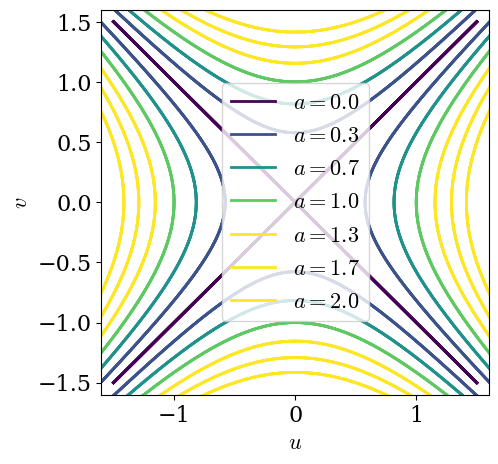

In [ ]:
from matplotlib import cm
fig, ax = plt.subplots(figsize=(5, 5)) 
sign = ["-", "+"]

lines = []
for j, a in enumerate(aa):
    for i in range(2):
        u0 = g(v0, a)
        list1 = [u0, u0, -u0, -u0, v0, v0, -v0, -v0]
        list2 = [v0, -v0, v0, -v0, u0, -u0, u0, -u0]
        for l1, l2 in zip(list1, list2):
            l, = ax.plot(l1, l2, color=cm.viridis(j/4), label=f"$a=%.1f$"%a)
    lines.append(l)

ax.set_xlabel("$u$")
ax.set_ylabel("$v$")
ax.set_xlim(-1.6, 1.6)
ax.set_ylim(-1.6, 1.6)
labels = [f"$a=%.1f$"%a for a in aa]
ax.legend(handles=lines)
fig.savefig('fig/assym/exceptional.pdf',bbox_inches="tight")
plt.show()

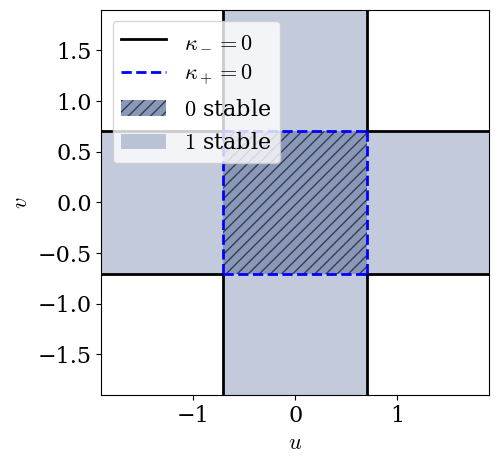

In [ ]:
fig, ax = plt.subplots(figsize=(5, 5)) 
L = 1.9
M = 1 / sqrt(2)
ax.plot([+M, +L], [+M, +M], "k-", label="$\kappa_- = 0$")
ax.plot([+M, +L], [-M, -M], "k-")
ax.plot([-L, -M], [+M, +M], "k-")
ax.plot([-L, -M], [-M, -M], "k-")
ax.plot([+M, +M], [+M, +L], "k-")
ax.plot([-M, -M], [+M, +L], "k-")
ax.plot([+M, +M], [-L, -M], "k-")
ax.plot([-M, -M], [-L, -M], "k-")

ax.plot([-M, +M], [+M, +M], "b--", label="$\kappa_+ = 0$")
ax.plot([-M, +M], [-M, -M], "b--")
ax.plot([+M, +M], [+M, -M], "b--")
ax.plot([-M, -M], [+M, -M], "b--")


ax.set_xlim(-L, L)
ax.set_ylim(-L, L)


from matplotlib import cm
rgba_to_hex = lambda rgba : '#'+''.join([f'{int(v*255):02x}' for v in rgba])
color = rgba_to_hex(cm.viridis(.25))

ax.fill_between([-M, M], -M, M, color=color, alpha=0.6, hatch='///', linewidth=0.0, edgecolor='#00000000', label="$0$ stable")
ax.fill_between([-L, -M], -M, M, color=color, alpha=0.3,  linewidth=0.0, edgecolor='#00000000', label="$1$ stable")
ax.fill_between([L, M], -M, M, color=color, alpha=0.3,  linewidth=0.0, edgecolor='#00000000')
ax.fill_between([-M, M], L, M, color=color, alpha=0.3,  linewidth=0.0, edgecolor='#00000000')
ax.fill_between([-M, M], -L, -M, color=color, alpha=0.3,  linewidth=0.0, edgecolor='#00000000')


ax.legend(loc=2)

ax.set_xlabel("$u$")
ax.set_ylabel("$v$")
fig.savefig('fig/assym/phase_a_0.pdf', bbox_inches="tight")


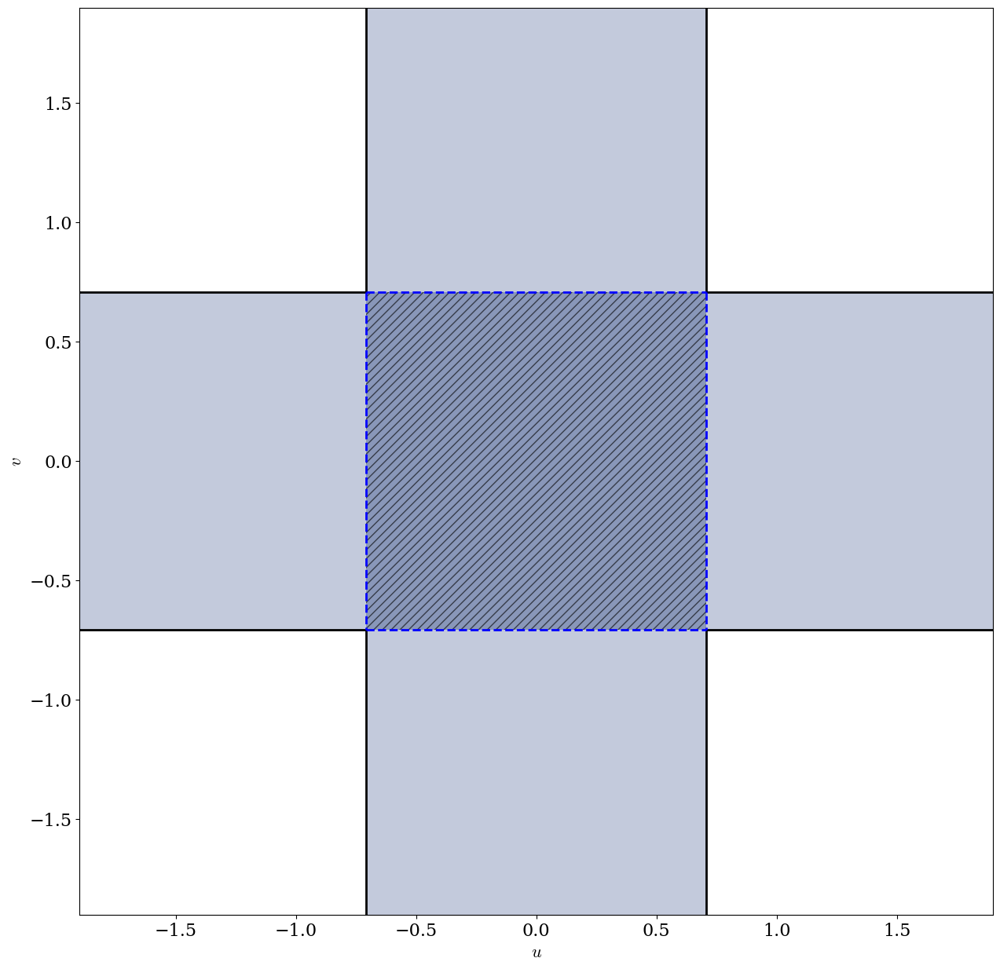

In [10]:
fig, ax = plt.subplots(figsize=(15, 15)) 
L = 1.9
M = 1 / sqrt(2)
ax.plot([+M, +L], [+M, +M], "k-")
ax.plot([+M, +L], [-M, -M], "k-")
ax.plot([-L, -M], [+M, +M], "k-")
ax.plot([-L, -M], [-M, -M], "k-")
ax.plot([+M, +M], [+M, +L], "k-")
ax.plot([-M, -M], [+M, +L], "k-")
ax.plot([+M, +M], [-L, -M], "k-")
ax.plot([-M, -M], [-L, -M], "k-")

ax.plot([-M, +M], [+M, +M], "b--")
ax.plot([-M, +M], [-M, -M], "b--")
ax.plot([+M, +M], [+M, -M], "b--")
ax.plot([-M, -M], [+M, -M], "b--")


ax.set_xlim(-L, L)
ax.set_ylim(-L, L)


from matplotlib import cm
rgba_to_hex = lambda rgba : '#'+''.join([f'{int(v*255):02x}' for v in rgba])
color = rgba_to_hex(cm.viridis(.25))

ax.fill_between([-M, M], -M, M, color=color, alpha=0.6, hatch='///', linewidth=0.0, edgecolor='#00000000', label="$0$ stable")
ax.fill_between([-L, -M], -M, M, color=color, alpha=0.3,  linewidth=0.0, edgecolor='#00000000', label="$1$ stable")
ax.fill_between([L, M], -M, M, color=color, alpha=0.3,  linewidth=0.0, edgecolor='#00000000')
ax.fill_between([-M, M], L, M, color=color, alpha=0.3,  linewidth=0.0, edgecolor='#00000000')
ax.fill_between([-M, M], -L, -M, color=color, alpha=0.3,  linewidth=0.0, edgecolor='#00000000')



ax.set_xlabel("$u$")
ax.set_ylabel("$v$")
fig.savefig('fig/assym/phase_a_02.pdf', bbox_inches="tight")


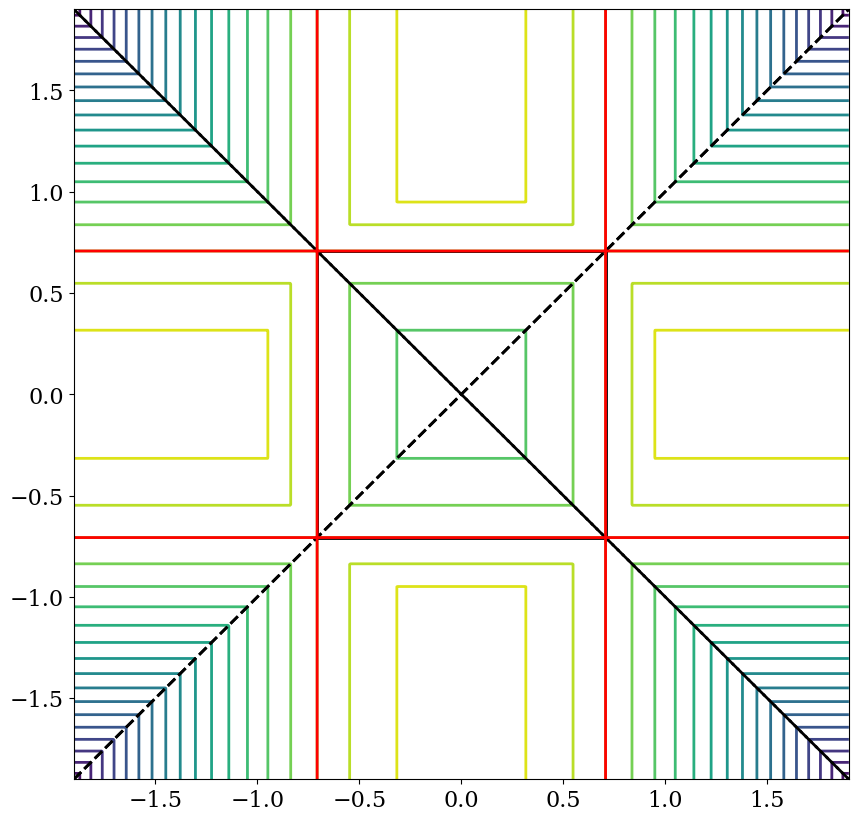

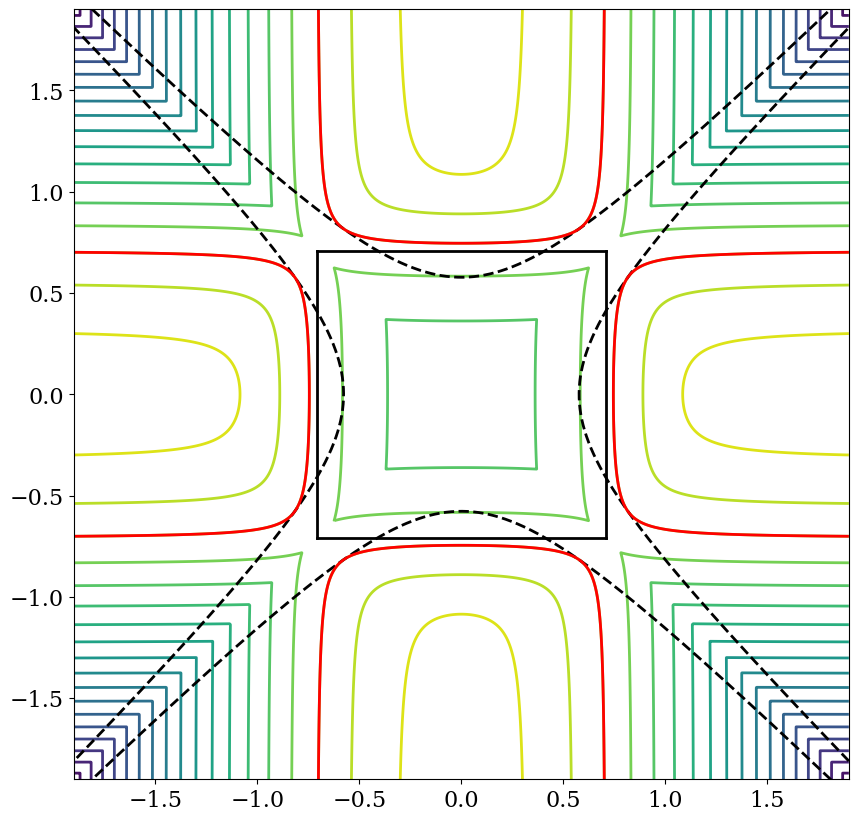

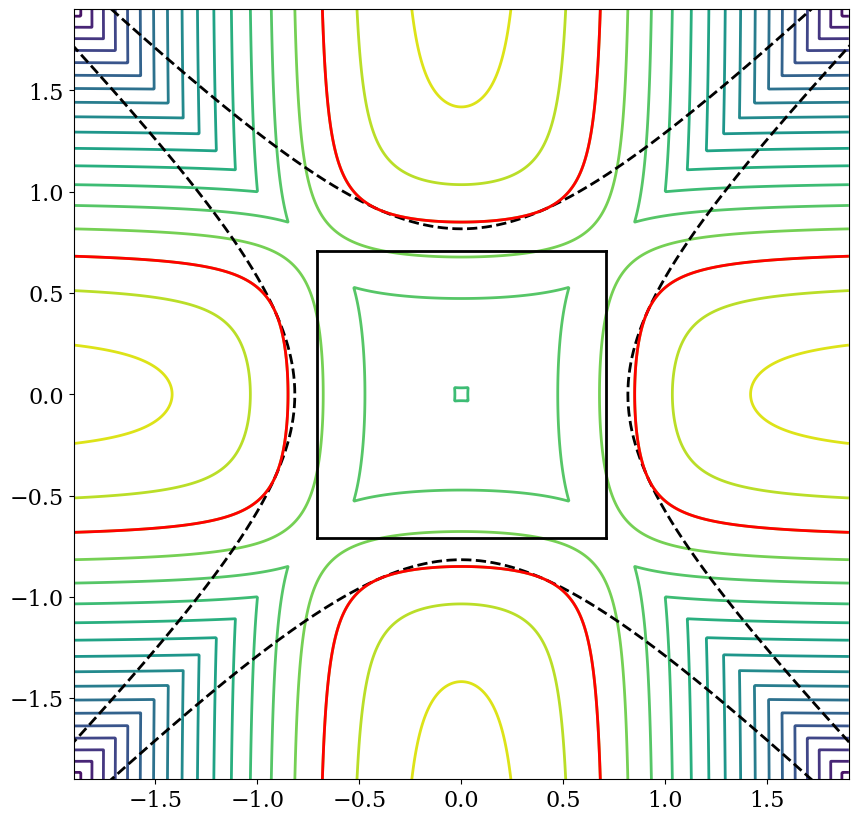

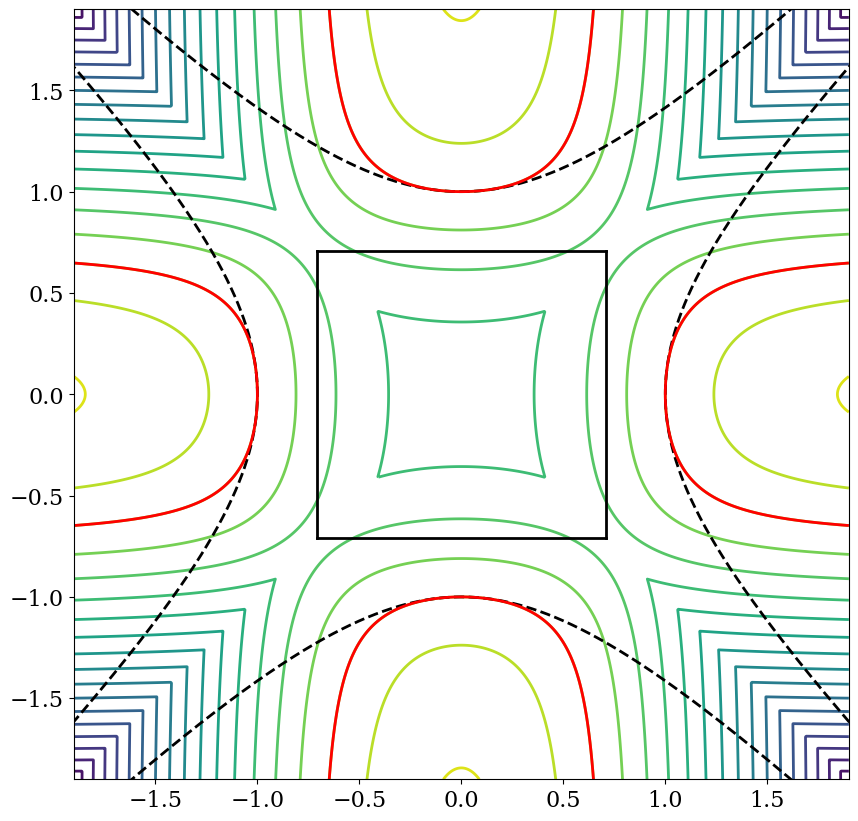

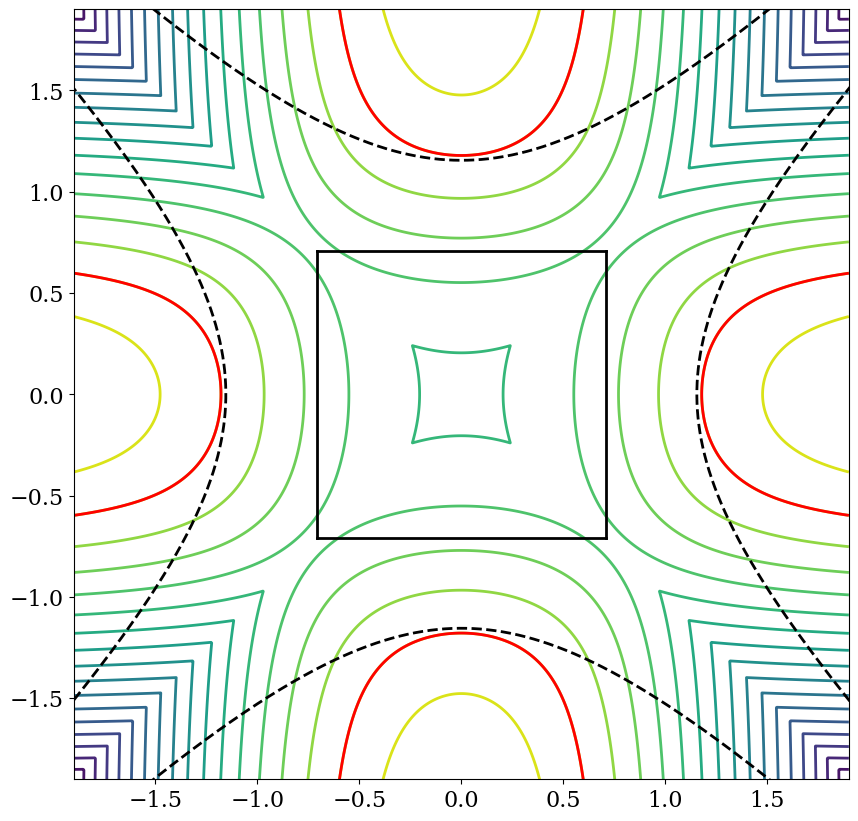

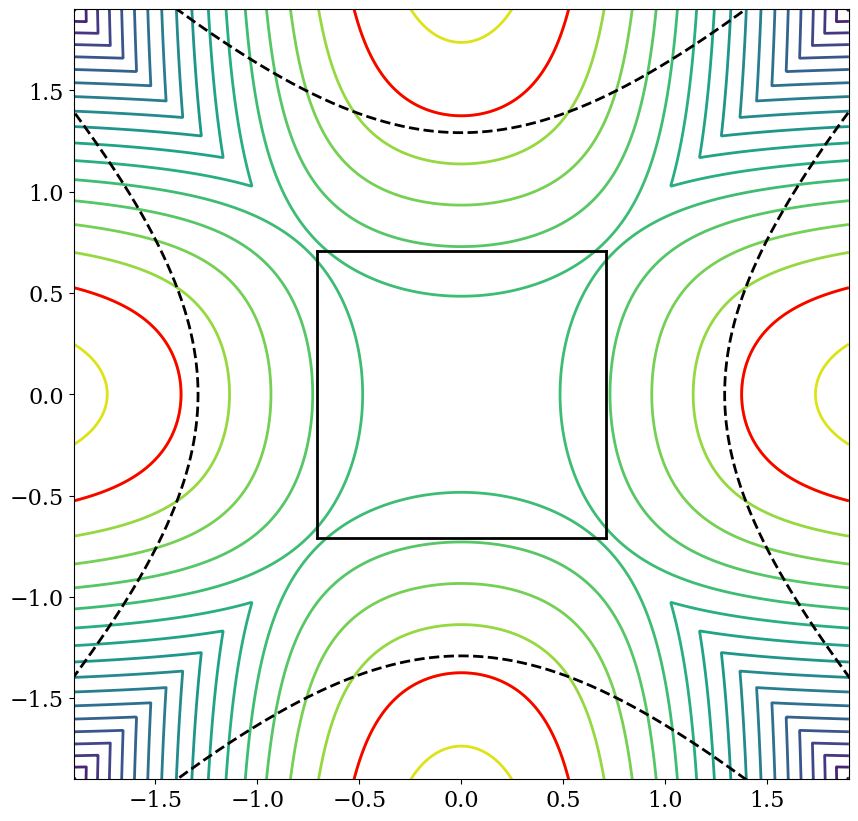

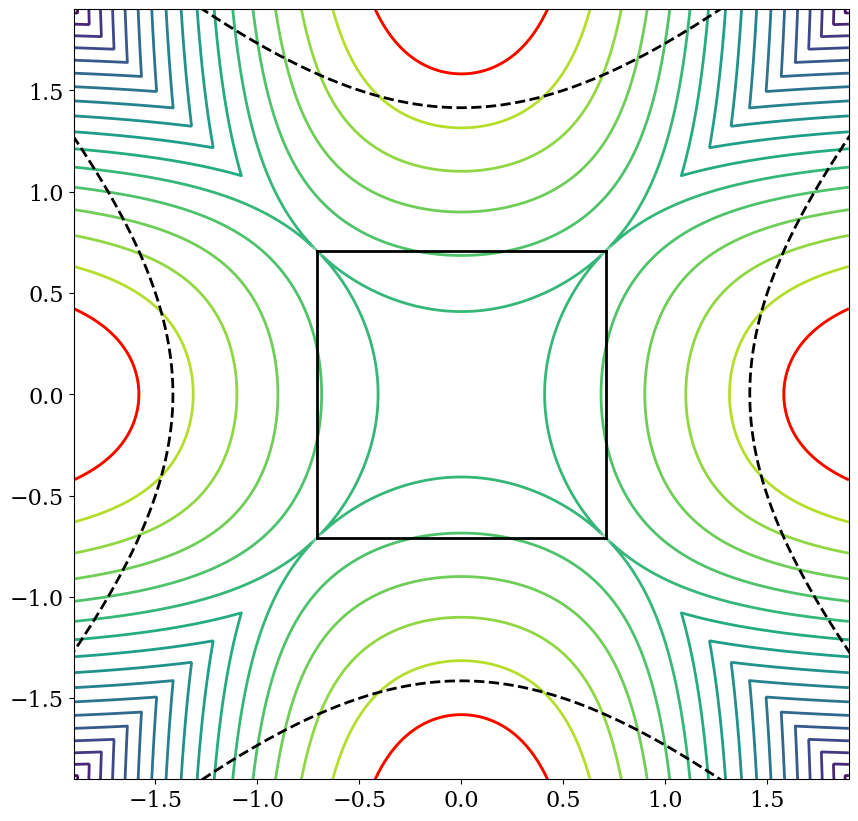

In [224]:
eq = lambda u, v, a: np.abs(u**2 - v**2 + 0j) - np.abs(u**2 + v**2 - 1 + a * 1j)


u0 = np.linspace(-L, L, 1001)
v0 = np.linspace(-L, L, 1001)
u, v = np.meshgrid(u0, v0)

for a in aa:
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.contour(u, v, eq(u, v, a), levels=20)
    
    
    # ax.contour(u, v, u**2 + v**2 - 1, levels=np.linspace(0, sqrt(2)*L, 20)**2 )

    ax.plot([-M, +M], [+M, +M], "k-")
    ax.plot([-M, +M], [-M, -M], "k-")
    ax.plot([+M, +M], [-M, +M], "k-")
    ax.plot([-M, -M], [-M, +M], "k-")

    ax.plot(v0, +sqrt(v0**2 + a), "k--")
    ax.plot(v0, -sqrt(v0**2 + a), "k--")
    ax.plot(+sqrt(v0**2 + a), v0, "k--")
    ax.plot(-sqrt(v0**2 + a), v0, "k--")

    ax.contour(u, v, eq(u, v, a),colors="red", levels=[0.,]) 

    ax.set_xlim(-L, L)
    ax.set_ylim(-L, L)
    plt.show()

In [225]:
eq1 = lambda u, v, a : np.abs(u**2 + v**2 -1 + a*1j)



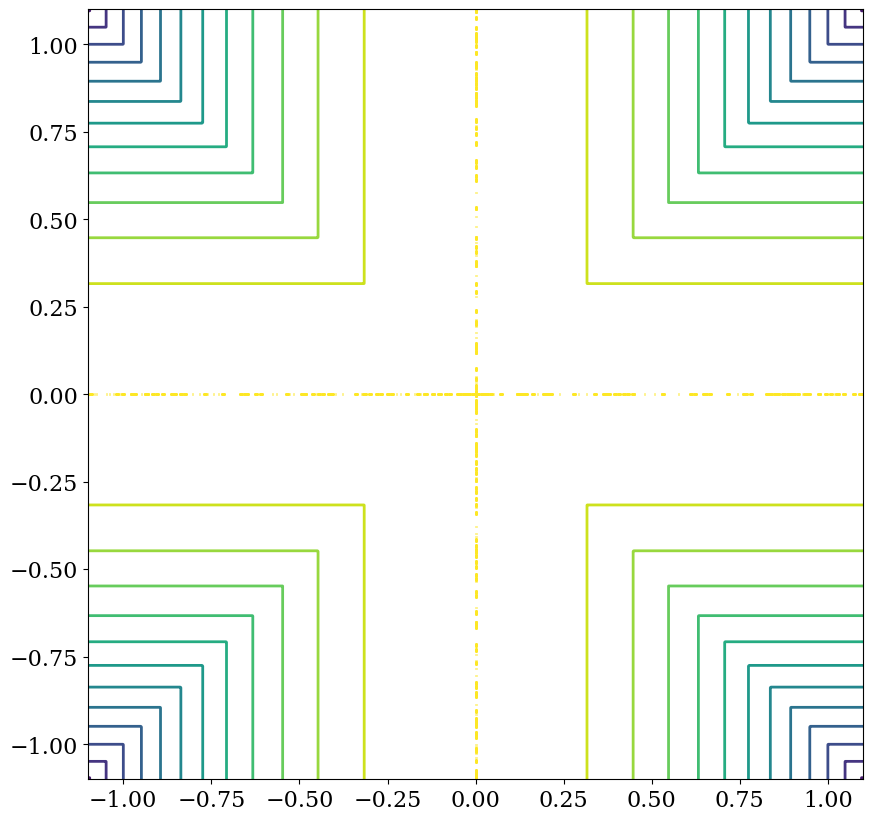

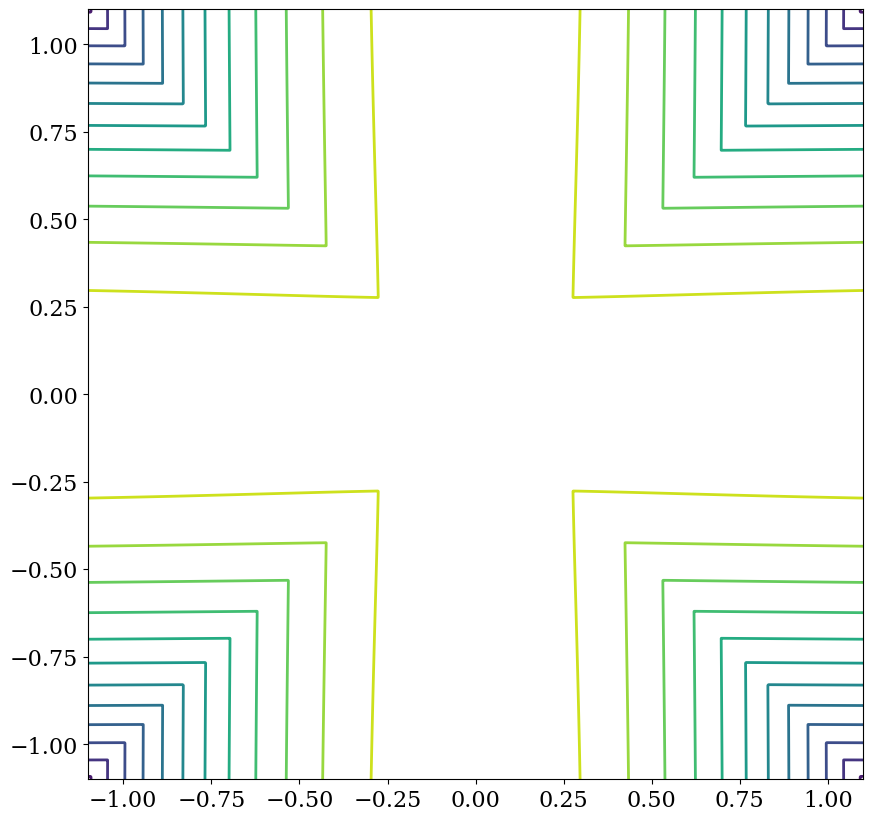

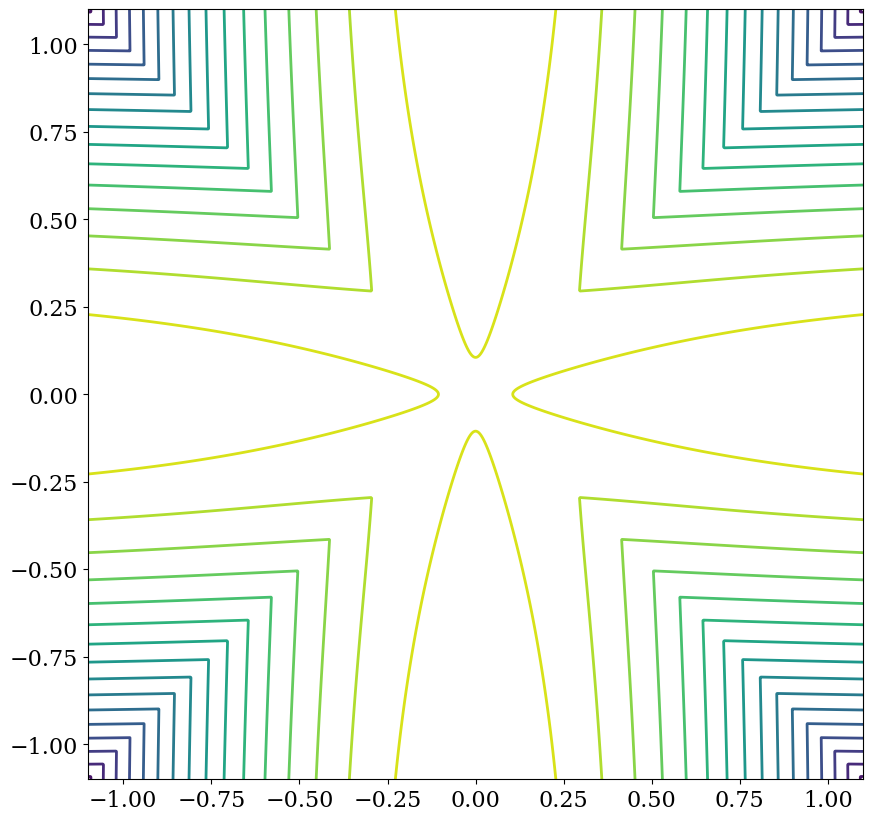

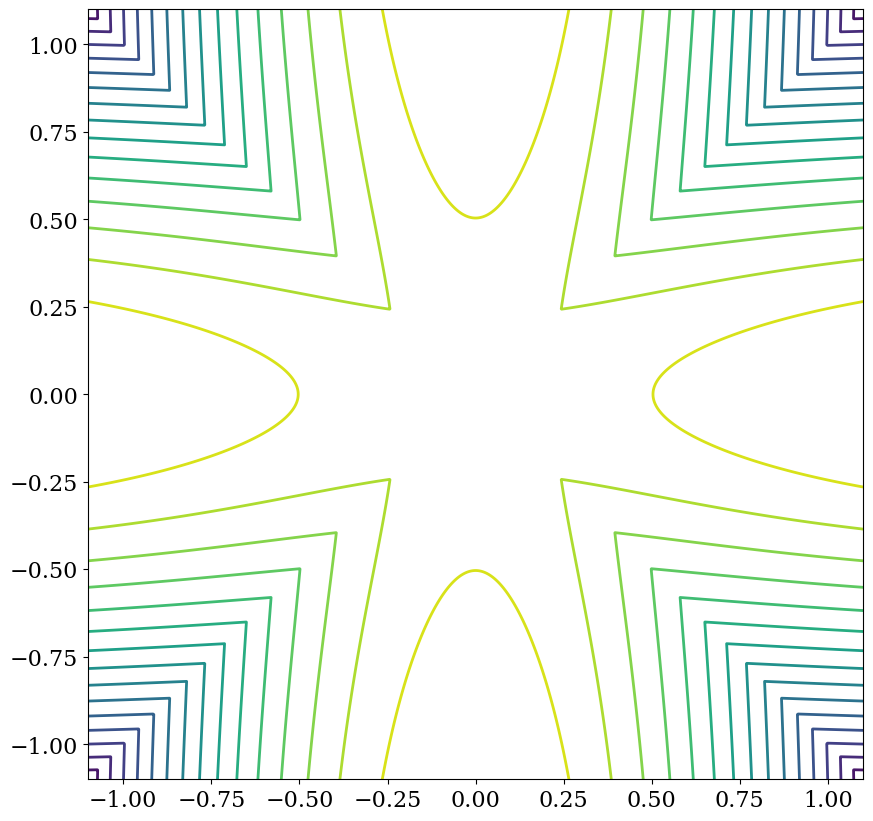

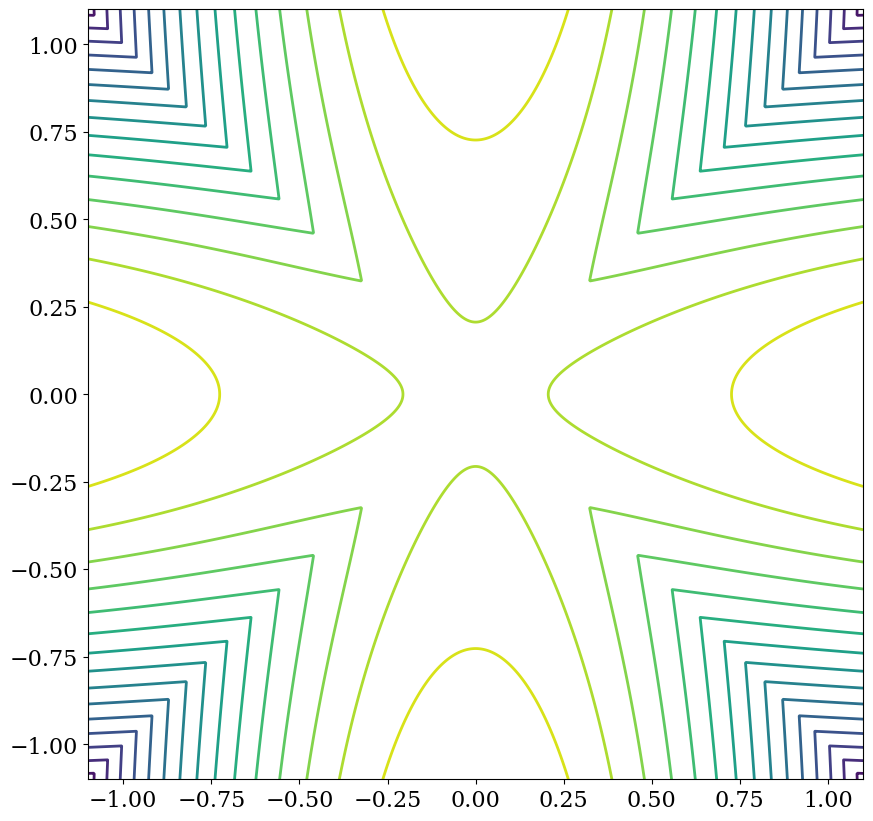

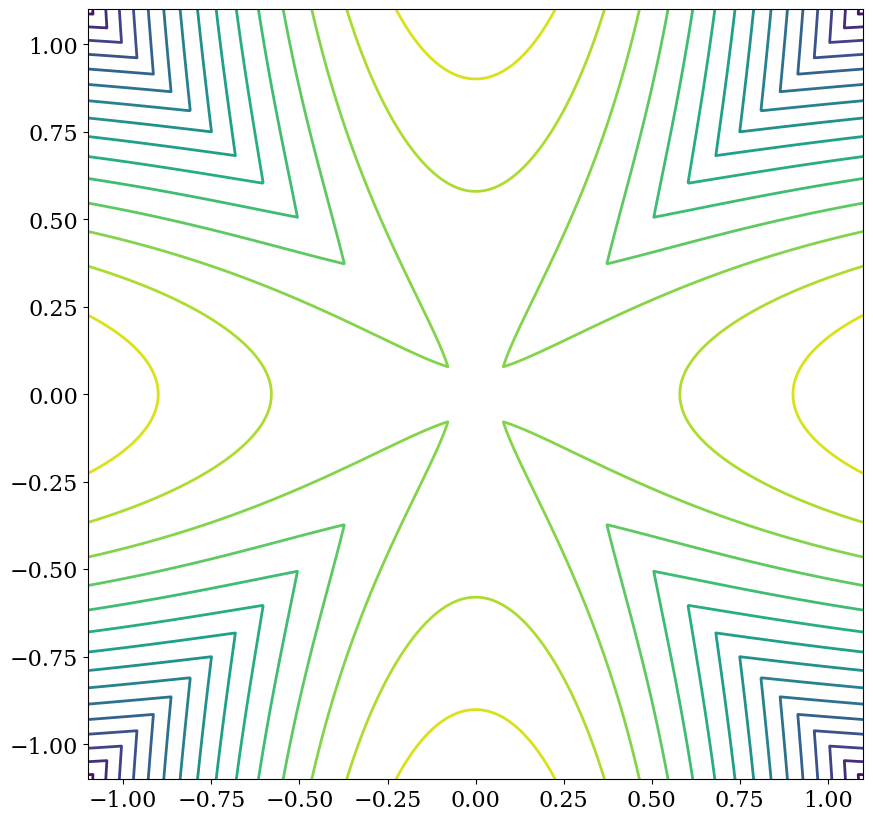

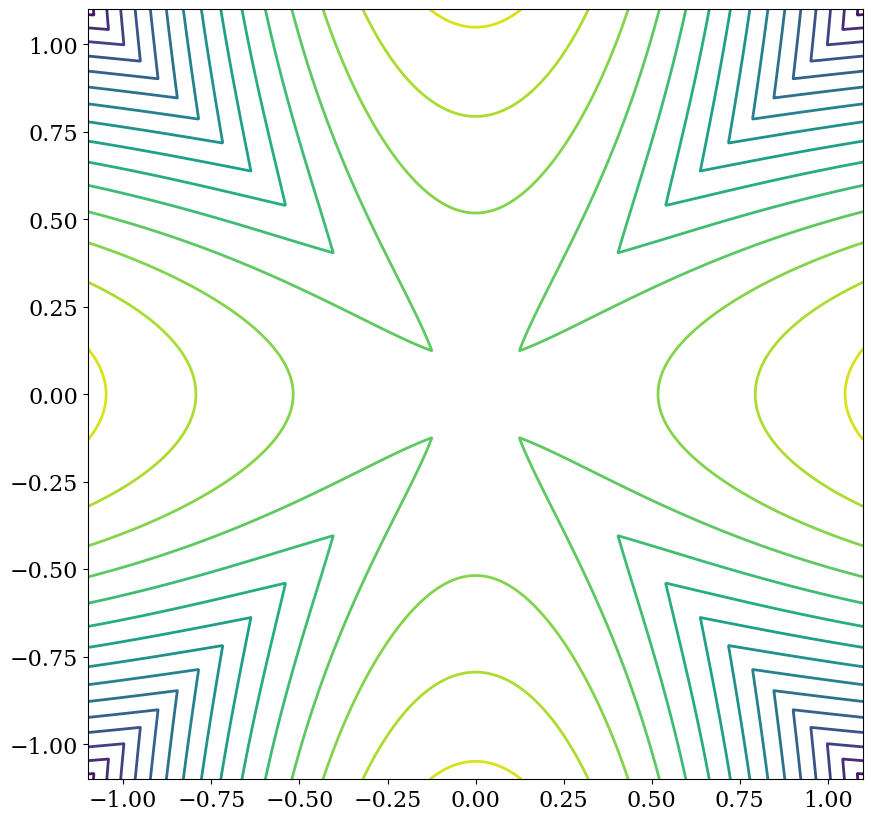

In [226]:
eq = lambda u, v, a: np.abs(u**2 - v**2 + 0j) - np.abs(u**2 + v**2 + 1 + a * 1j)

L = 1.1

u = np.linspace(-L, L, 1001)
v = np.linspace(-L, L, 1001)
u, v = np.meshgrid(u,v)

for a in aa:
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.contour(u, v, eq(u, v, a), levels=15)
    plt.show()

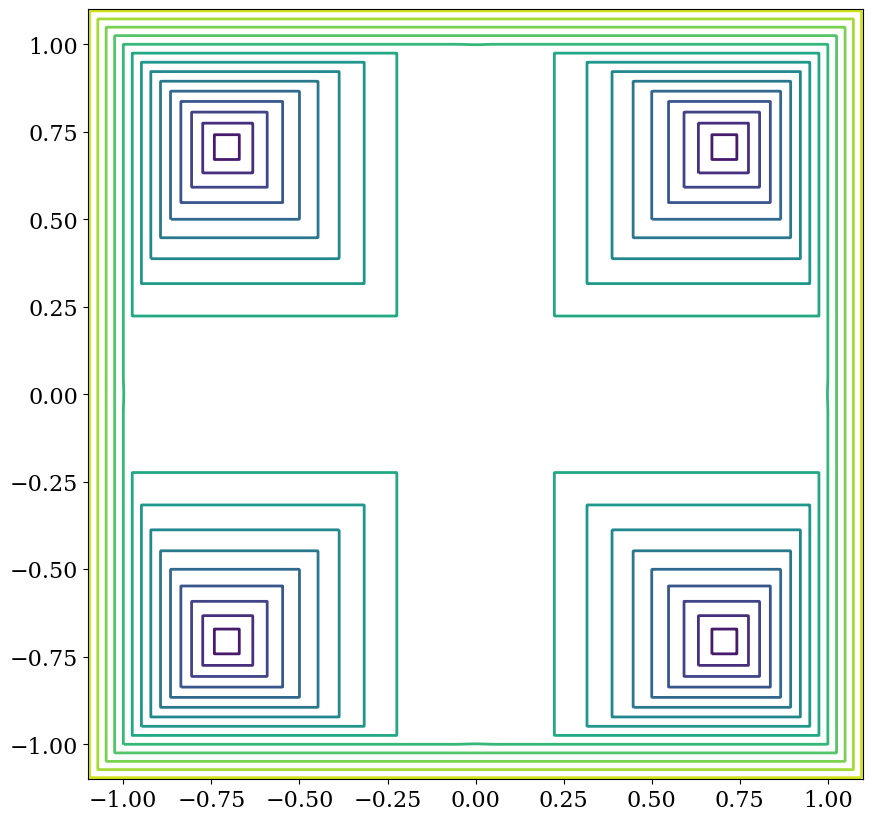

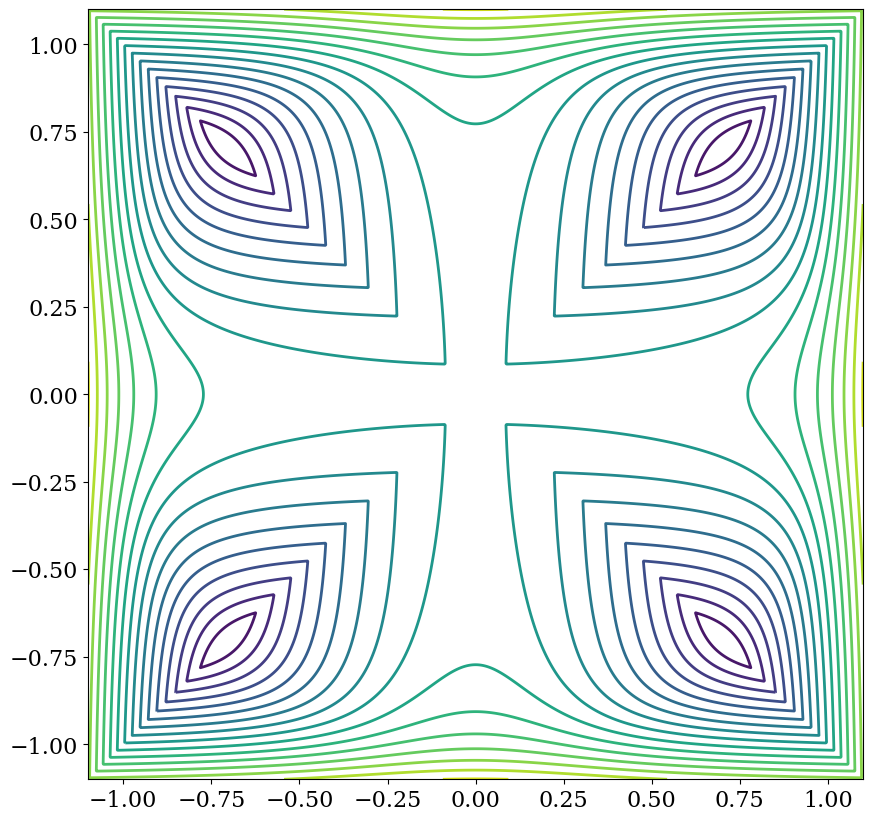

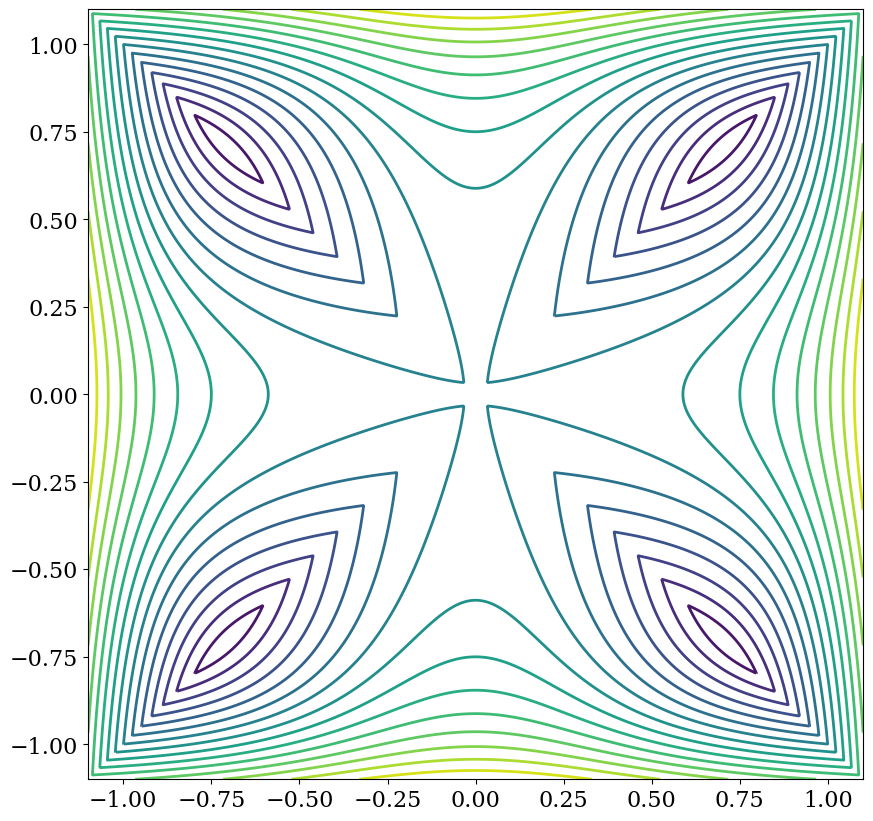

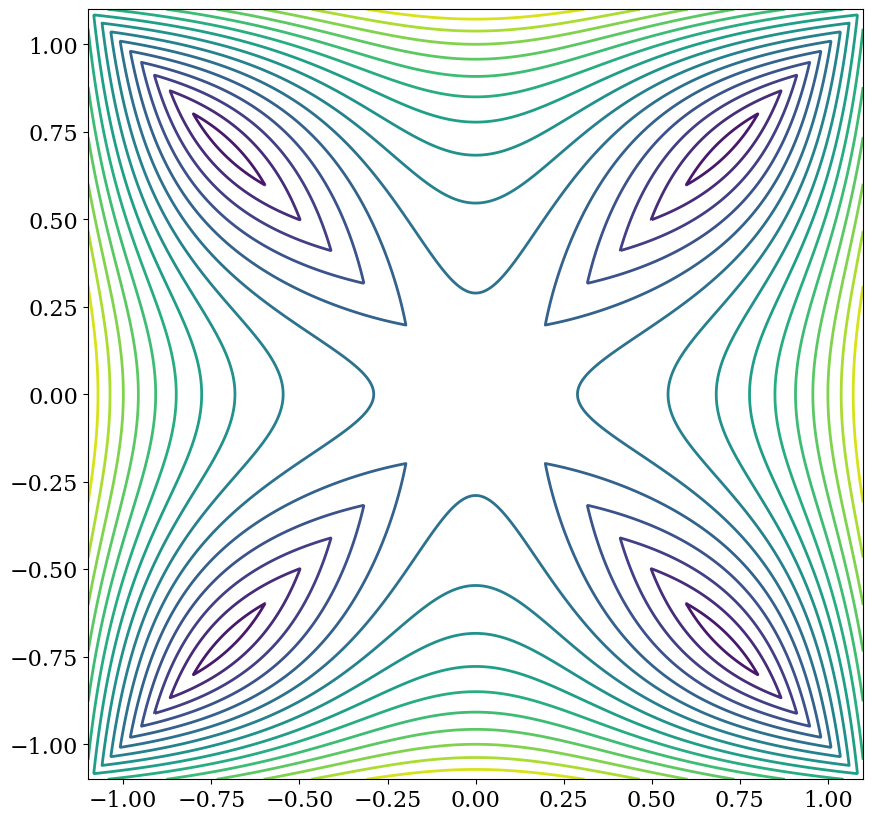

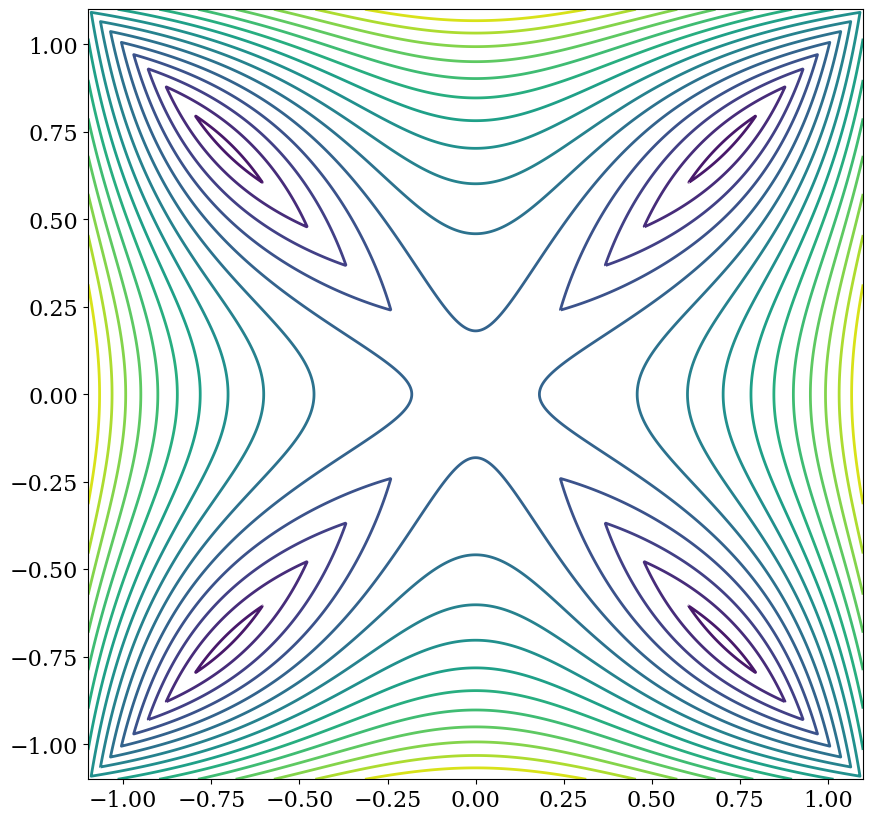

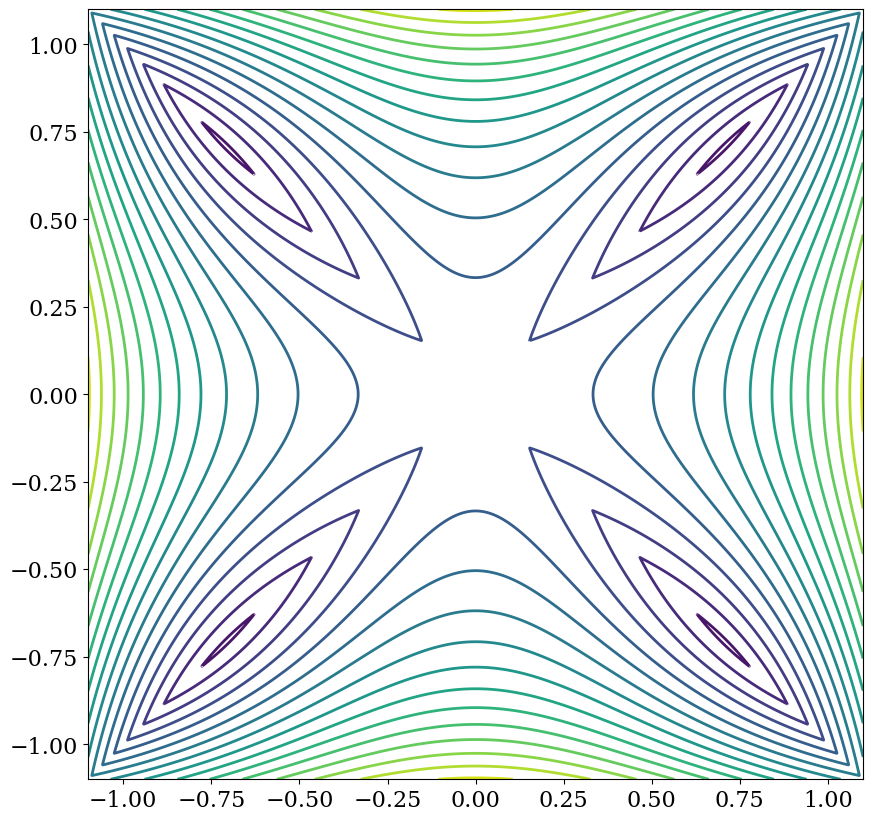

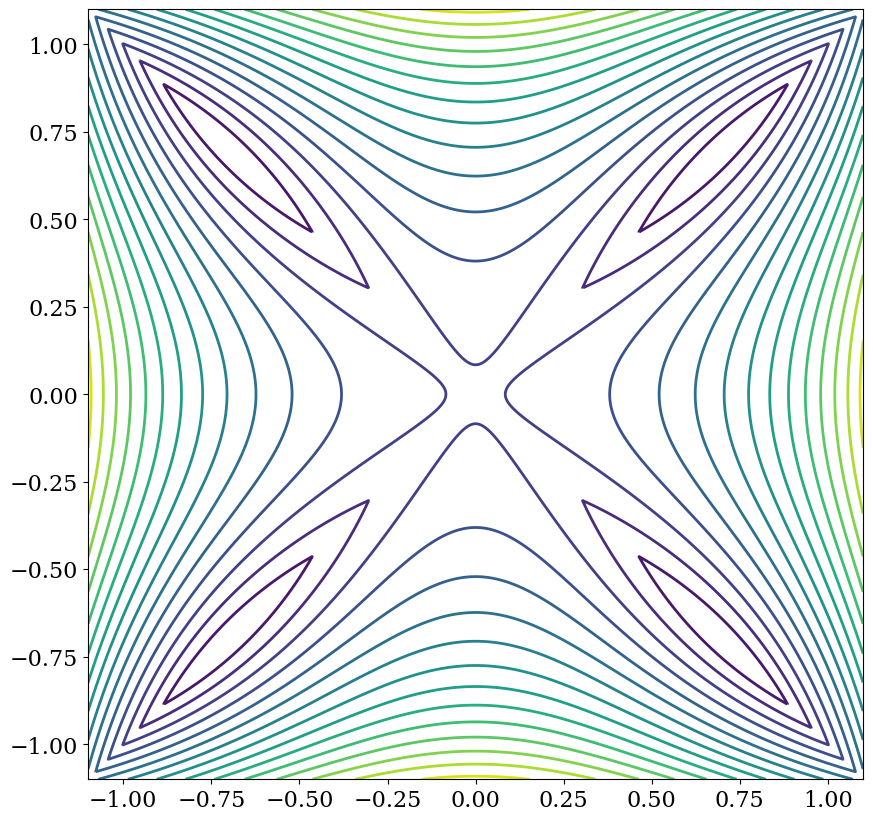

In [227]:
eq = lambda u, v, a: np.abs(u**2 - v**2 + 0j) + np.abs(u**2 + v**2 - 1 + a * 1j)

L = 1.1

u = np.linspace(-L, L, 1001)
v = np.linspace(-L, L, 1001)
u, v = np.meshgrid(u,v)

for a in aa:
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.contour(u, v, eq(u, v, a), levels=15)
    plt.show()

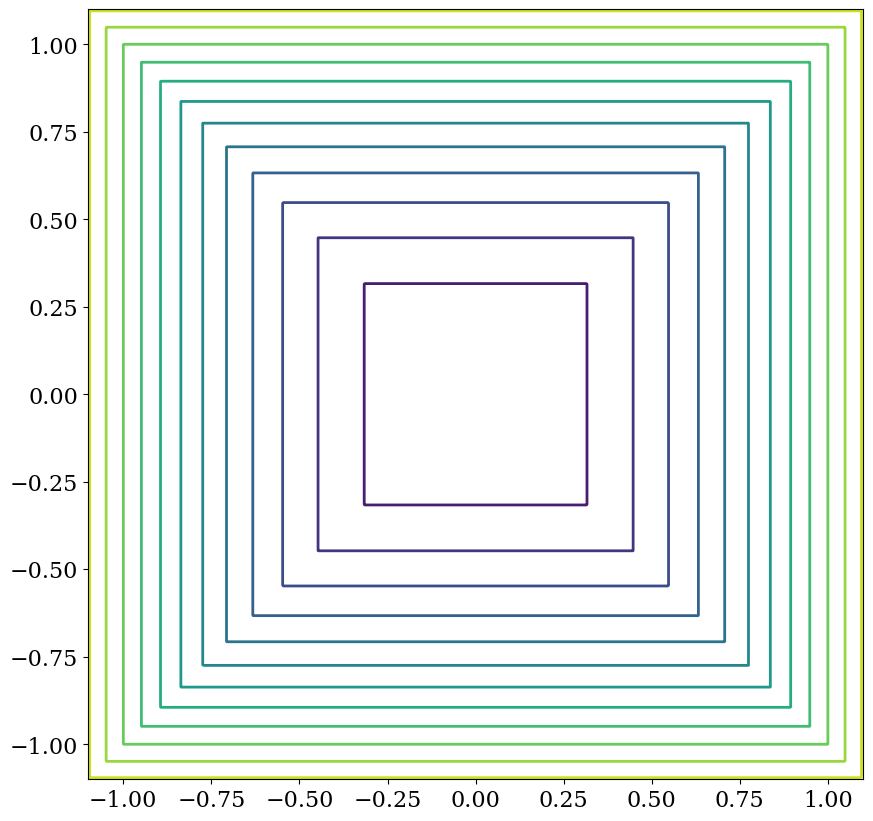

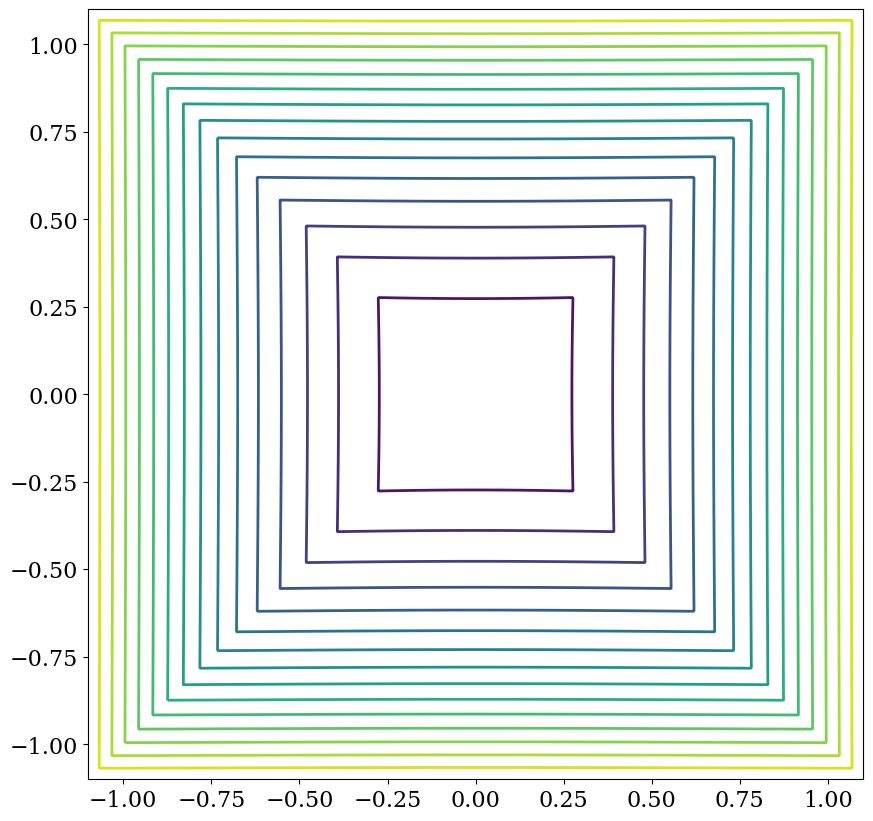

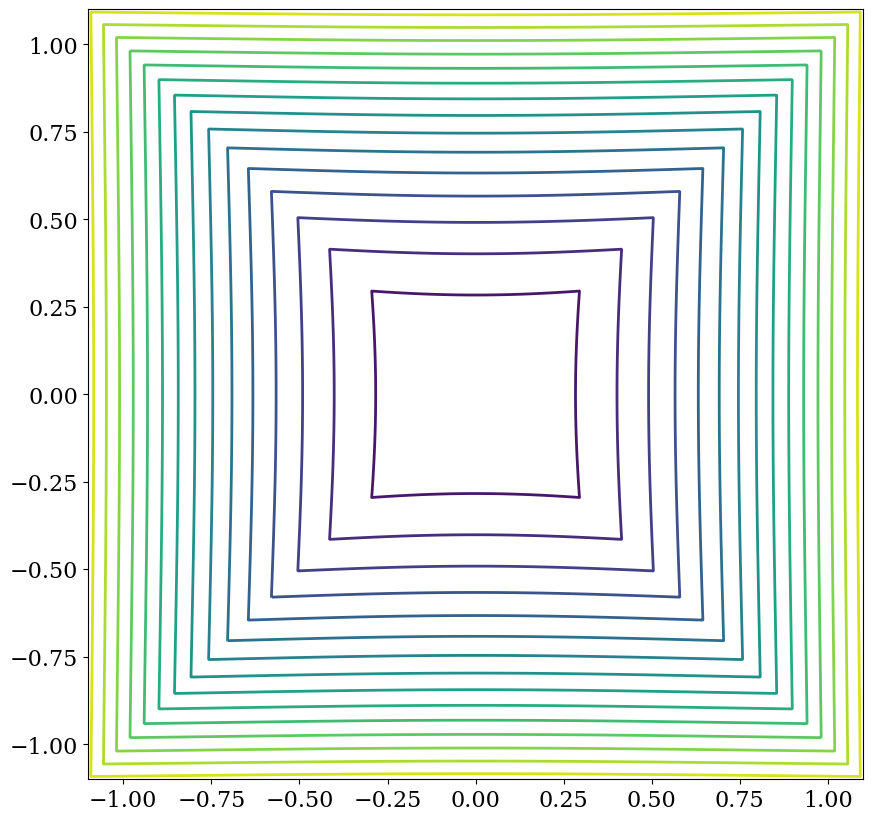

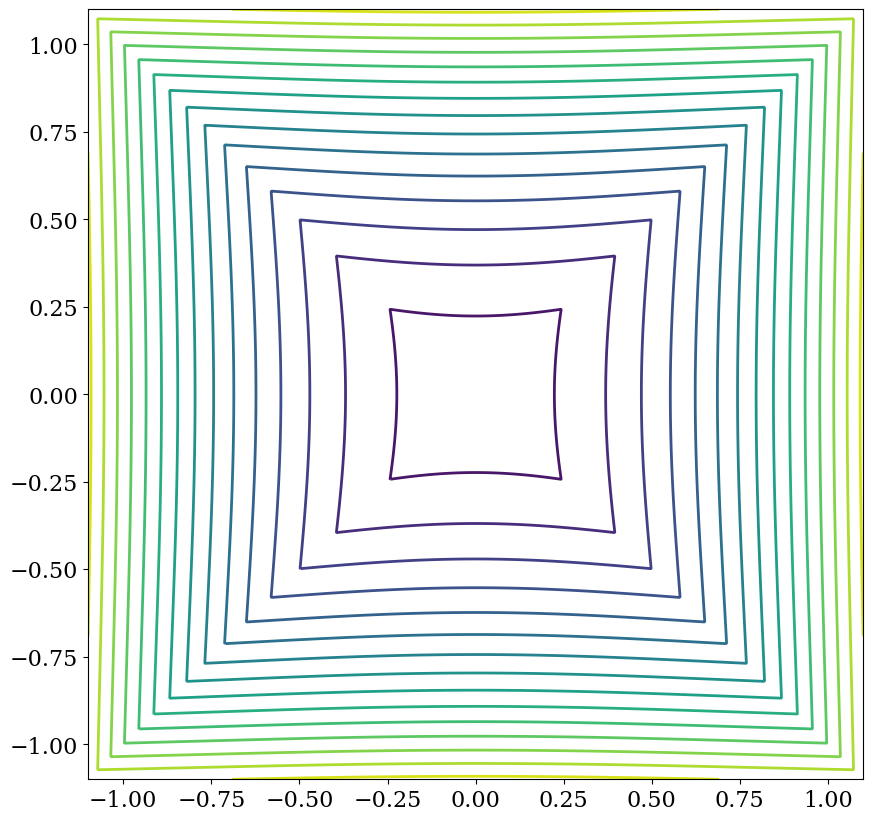

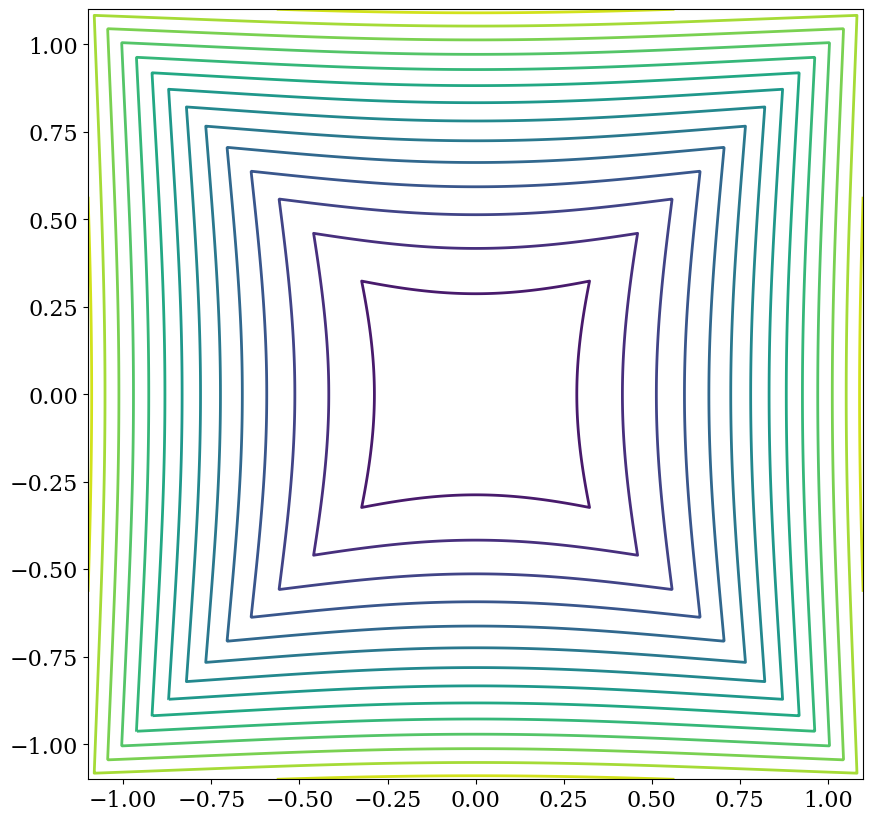

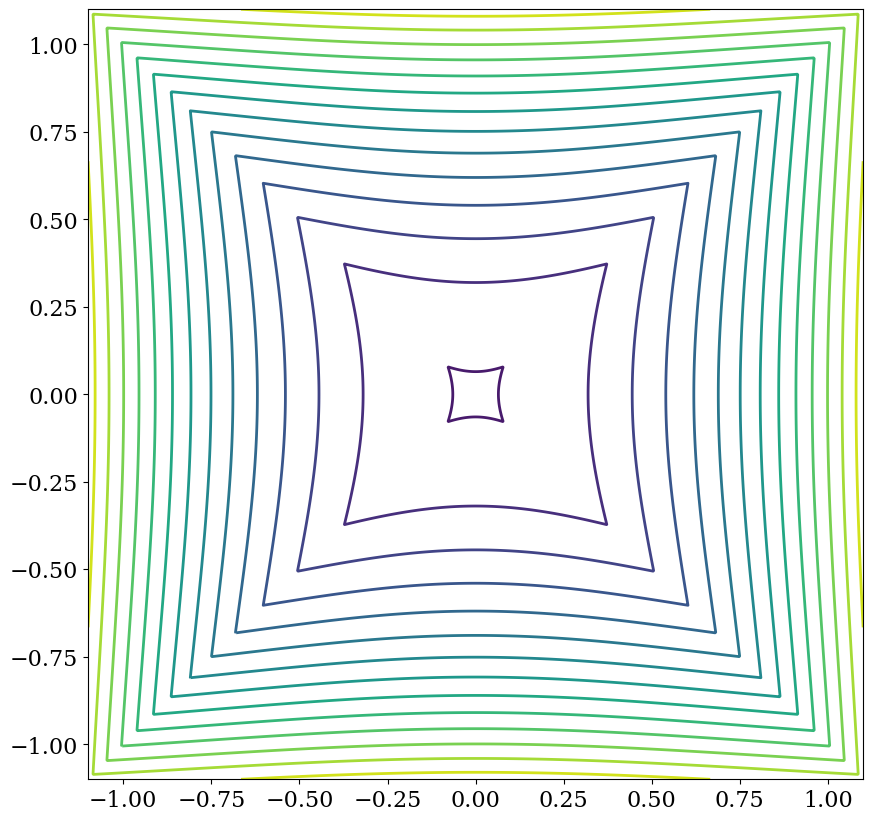

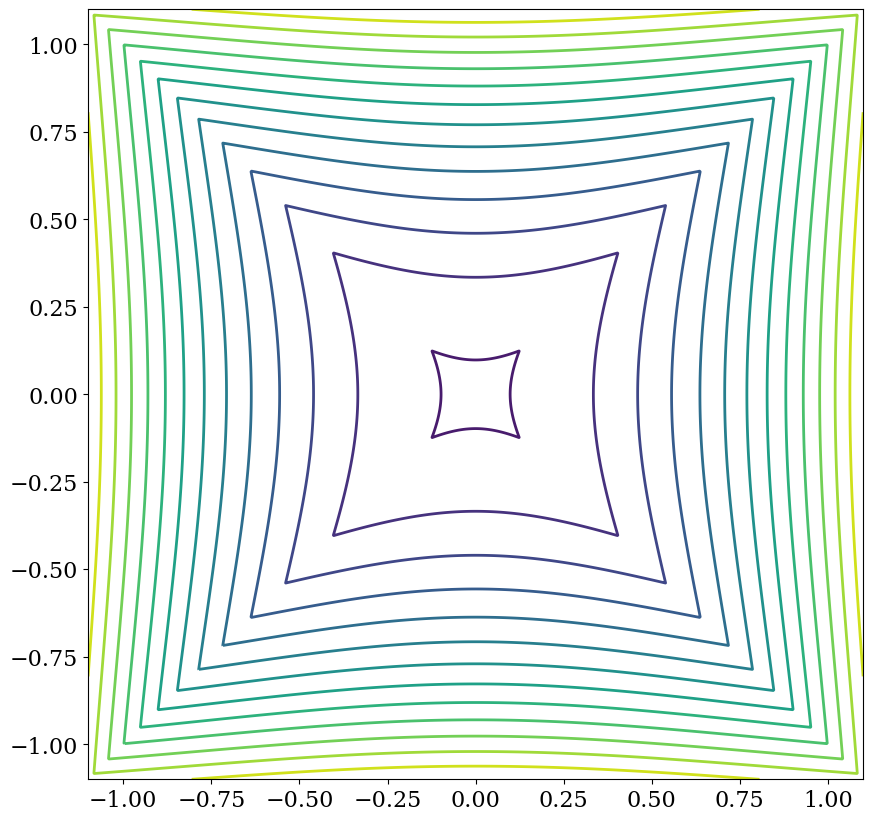

In [228]:
eq = lambda u, v, a: np.abs(u**2 - v**2 + 0j) + np.abs(u**2 + v**2 + 1 + a * 1j)

L = 1.1

u = np.linspace(-L, L, 1001)
v = np.linspace(-L, L, 1001)
u, v = np.meshgrid(u,v)

for a in aa:
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.contour(u, v, eq(u, v, a), levels=15)
    plt.show()